C:/Users/admin/Desktop/EMG_IA_LIT GITHUB/EMG_IA_LIT/EMG-LIT/EMG-S1


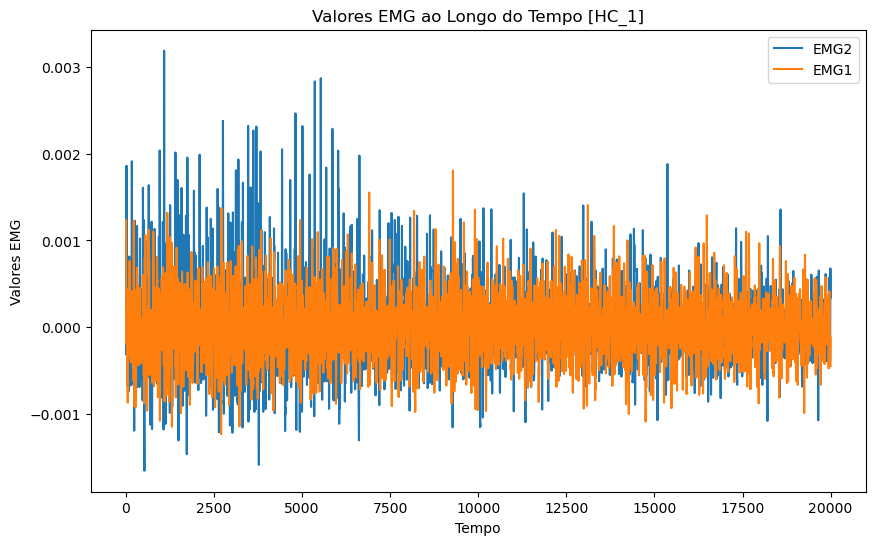

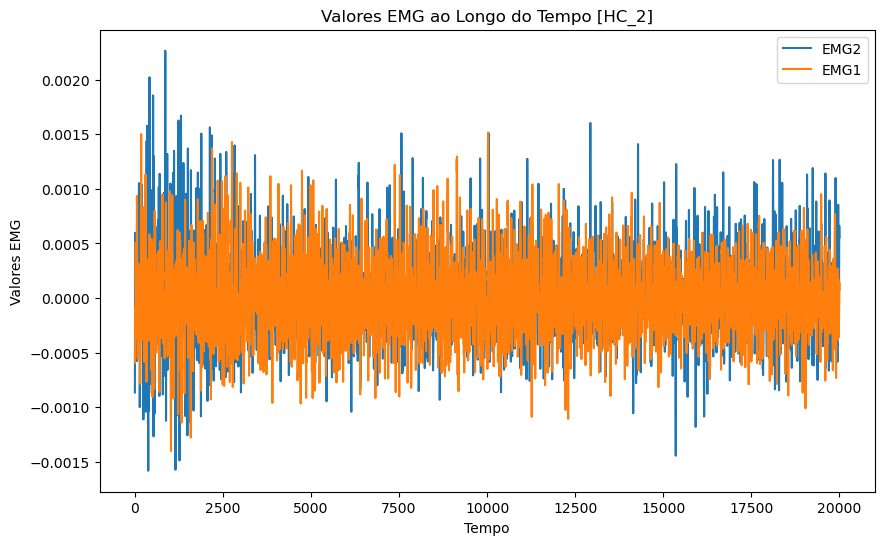

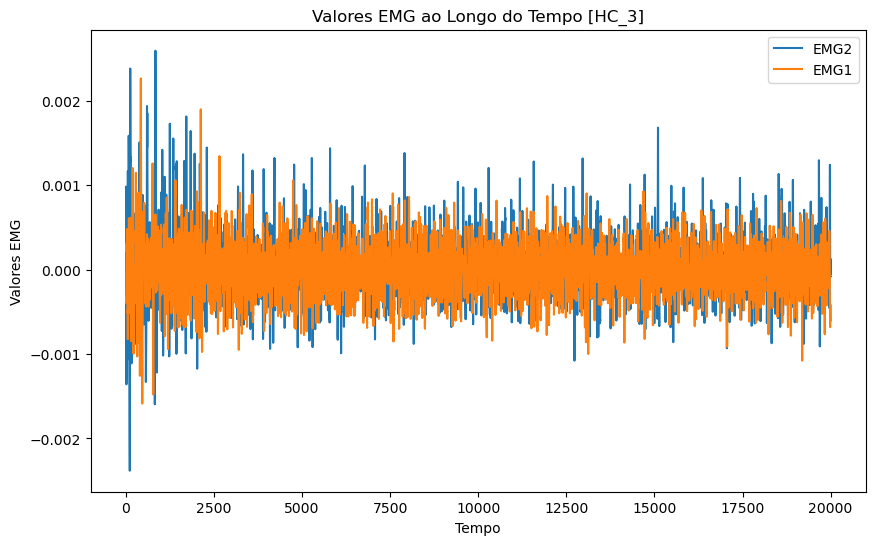

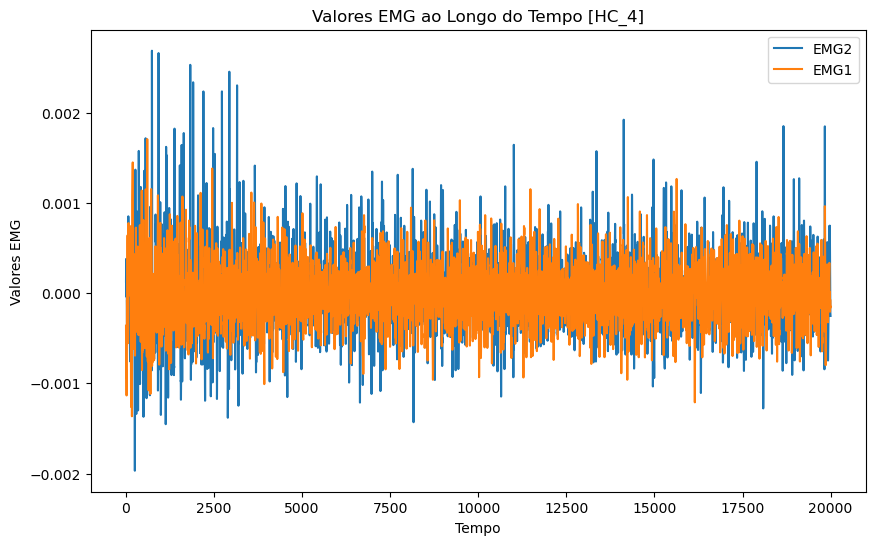

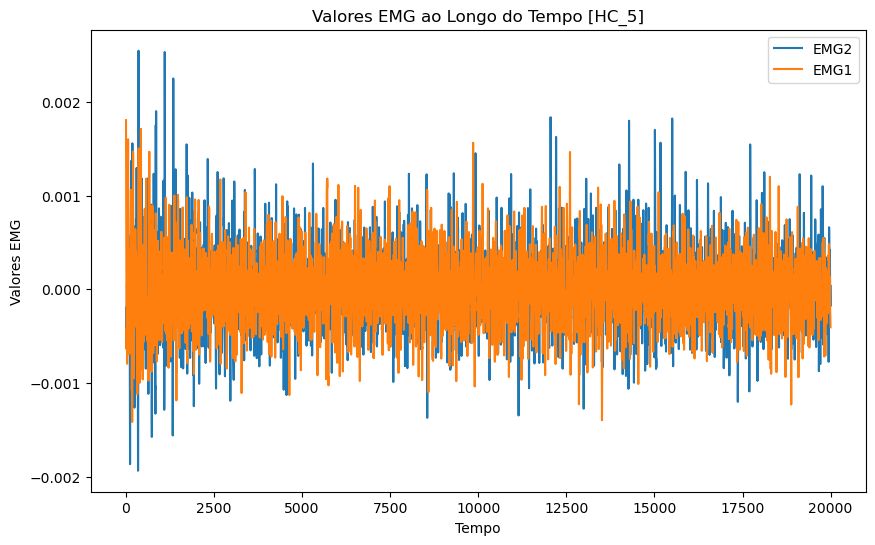

...

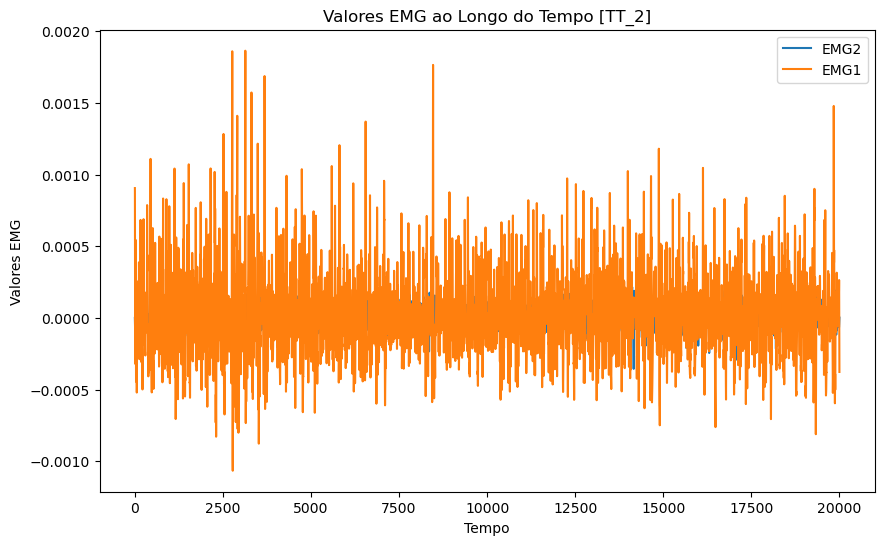

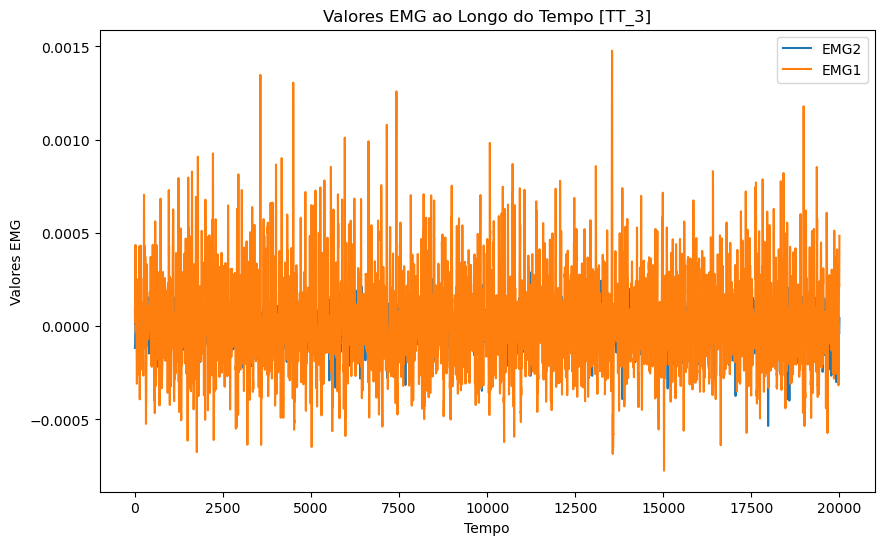

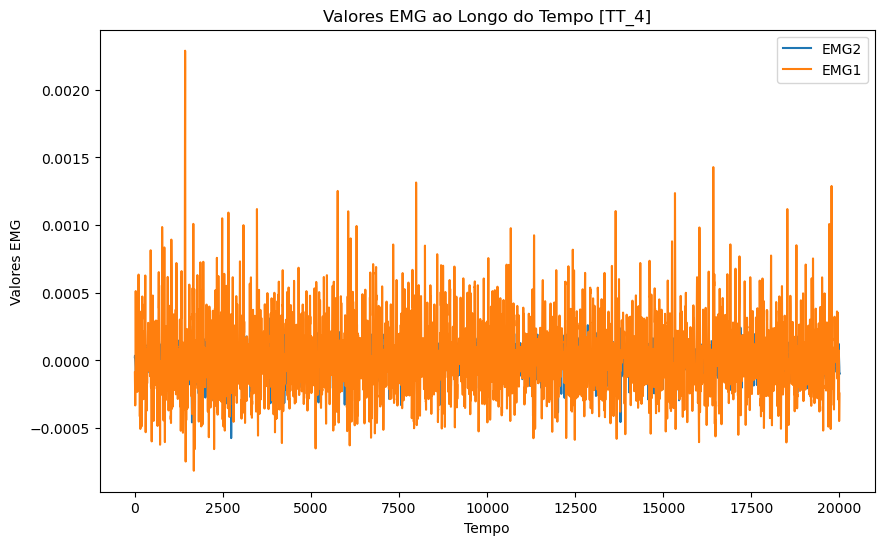

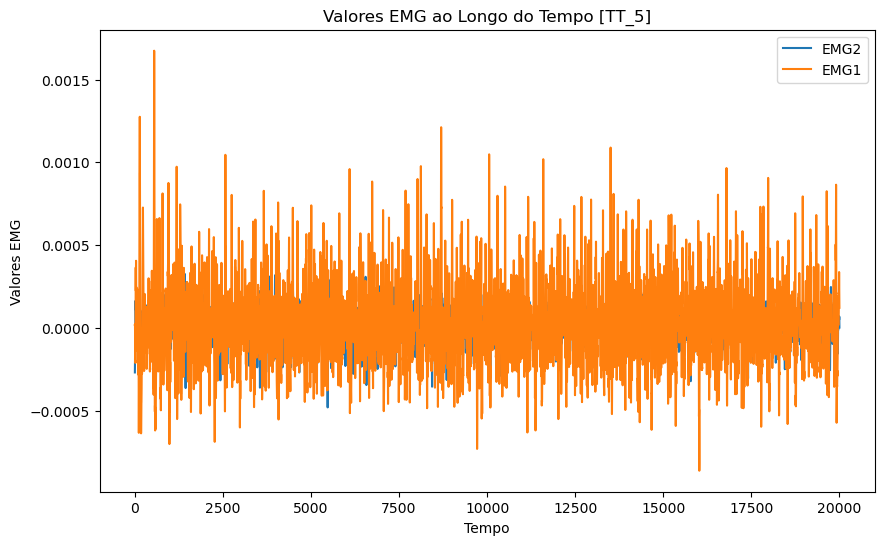

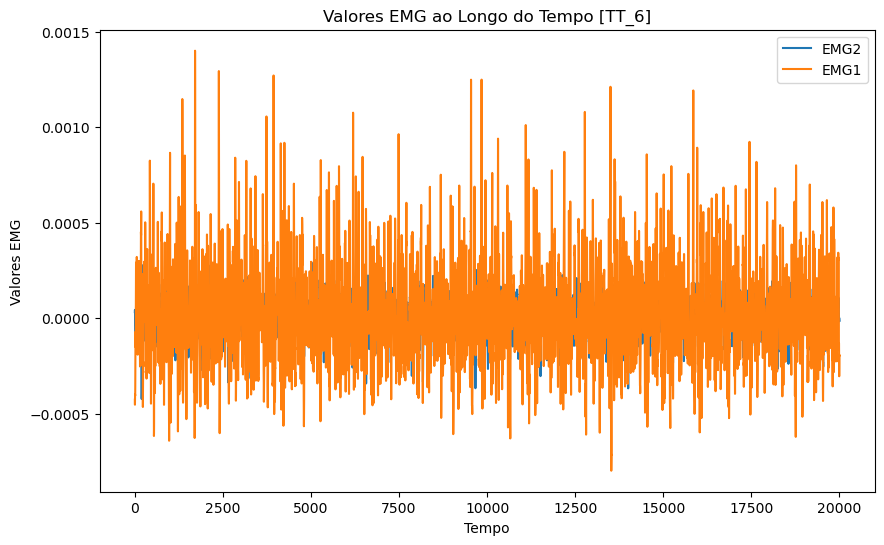

Valor mínimo de EMG1: -0.001229651
Valor máximo de EMG1: 0.001803079
Valor mínimo de EMG2: -0.001649887
Valor máximo de EMG2: 0.003183397


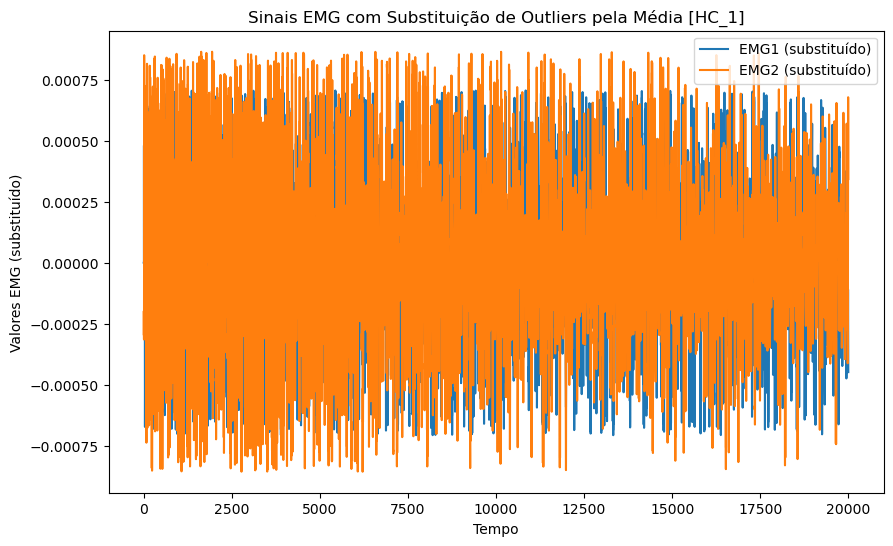

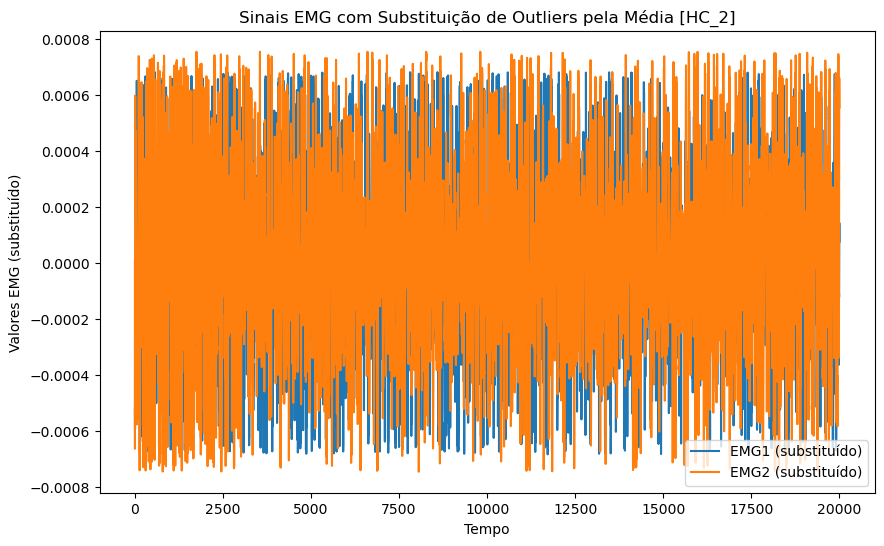

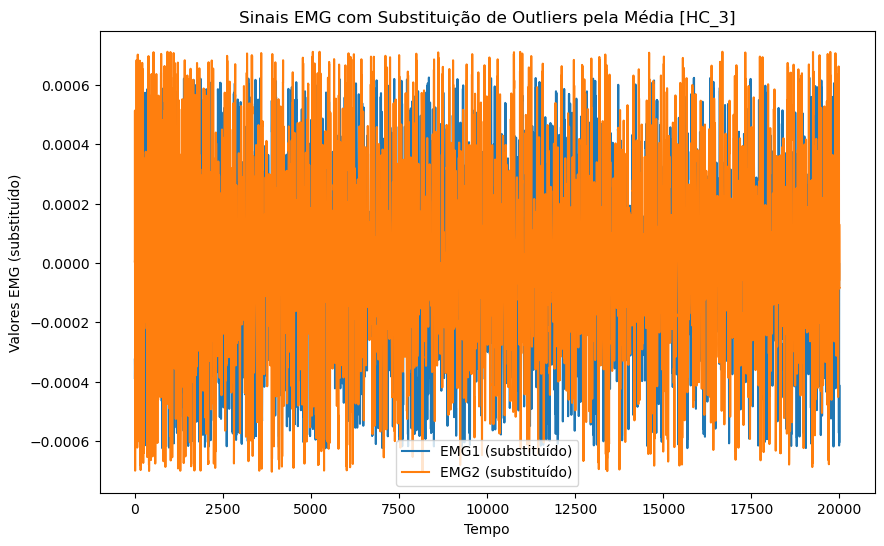

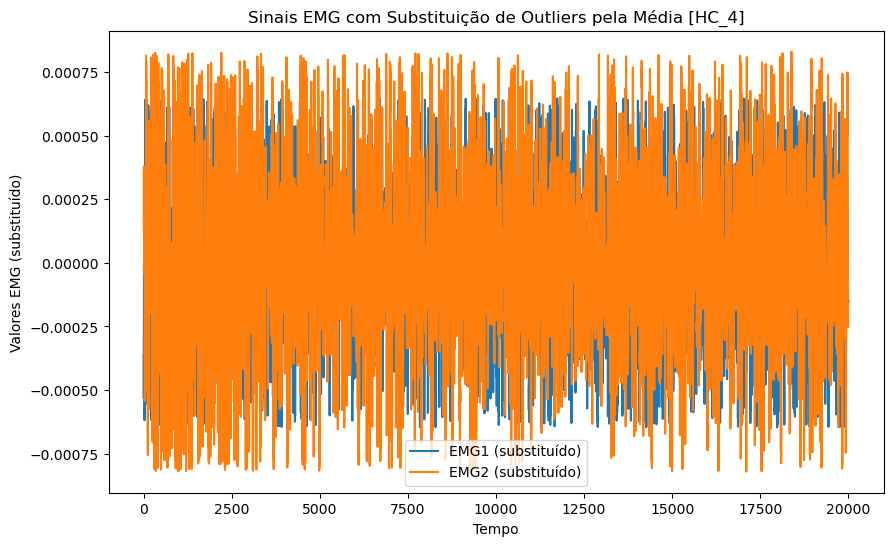

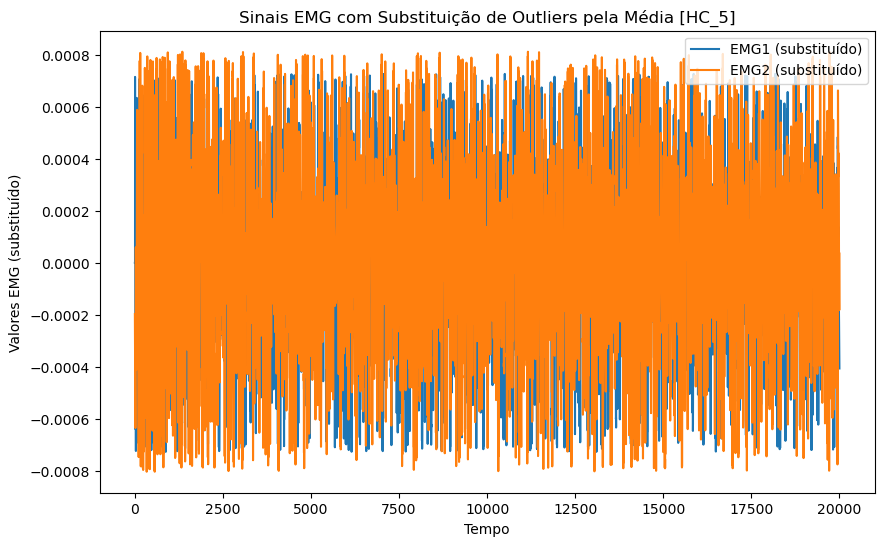

...

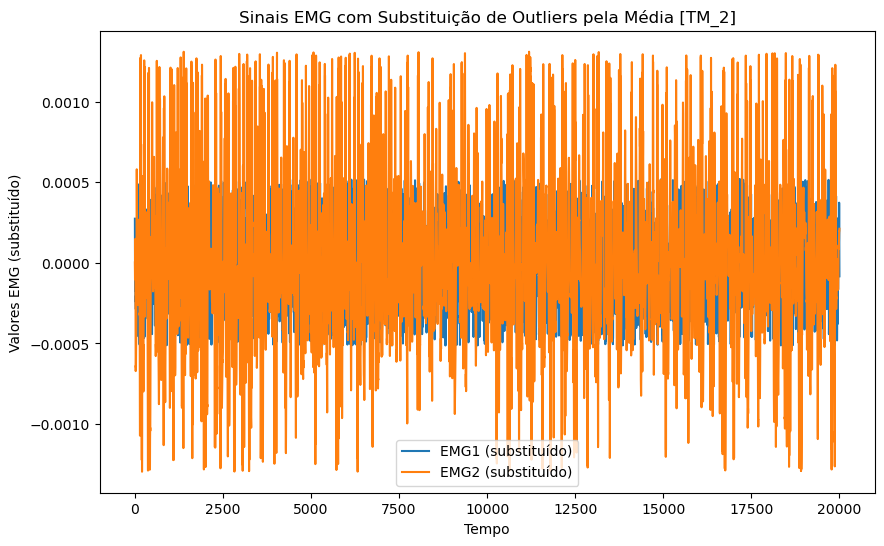

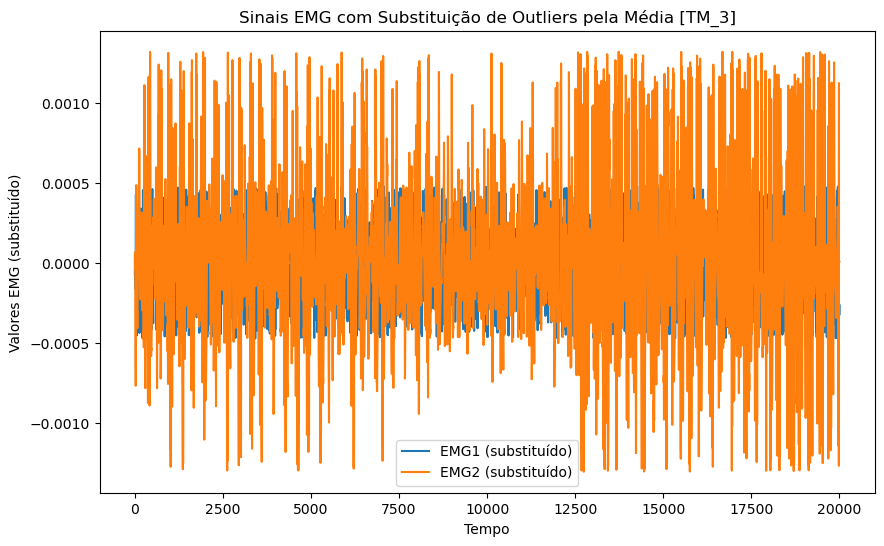

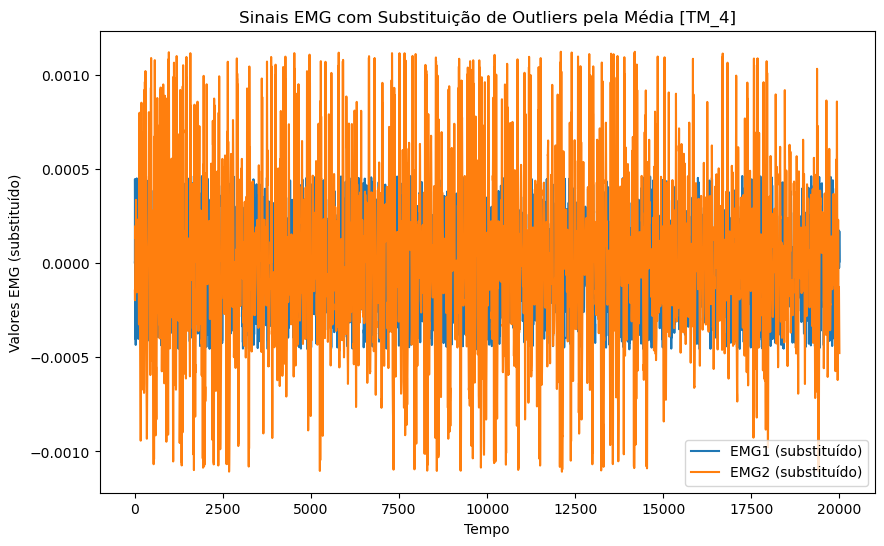

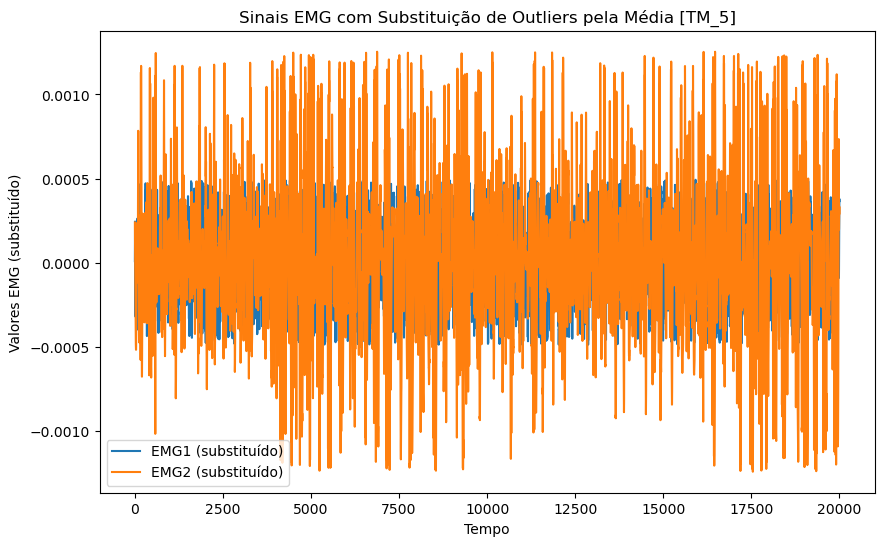

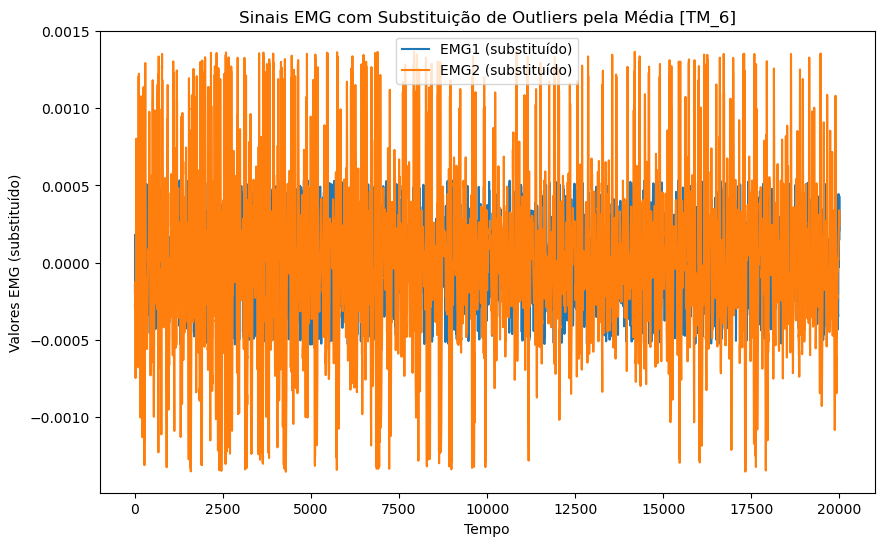

In [1]:
%run "./3_Removendo_Outliers.ipynb"

# Extração de Características

## Usando a extração de Features getfTDDfeat_v2

In [15]:
"""
% getfTDDfeat_v2: A Fusion of Time-Domain Descriptors.
%
% feat = getfTDDfeat_v2(x,winsize,wininc,datawin,dispstatus)
%
% Author Rami Khushaba 
%
% This function computes the fused time-domain features of the signals in x,
% x could be made of many columns (or just one), each representing a channel/sensor. 
% For example if you get 5 sec of data from 8 channels/sensors at 1000 Hz 
% then x should be 5000 x 8. A windowing scheme is used here to extract features 
%
% The signals in x are divided into multiple windows of size
% winsize and the windows are space wininc apart.
%
%
% Inputs
%    x: 		columns of signals
%    steps:     variable denoting the number of steps away from the current window (for example a number from 3 to 25, read the paper)
%    winsize:	window size (length of x)
%    wininc:	spacing of the windows (winsize)
%    datawin:   window for data (e.g. Hamming, default rectangular)
%               must have dimensions of (winsize,1)
%    dispstatus:zero for no waitbar (default)
%
% Outputs
%    feat:      fused time domain features (6 features per channel)
%             
%
% Modifications
% 23/06/2004   template imported from http://www.sce.carleton.ca/faculty/chan/index.php?page=matlab
% 17/11/2013   RK: Spectral moments first created.
% 15/01/2016   RK: created fTDD method
% 21/02/2019   RK: moving this to GitHub
% 13/03/2020   RK: added version v2
%% P.S: The main difference in v2 from the originally published is the fact that the original had (num./den) .* (num2./den2). However, as we are taking the logarthimic version of num and den then subtracting these is also equivalent to division, i.e., log(num./den) = log(num)-log(den) which we did here.

%% References
% [1] R. N. Khushaba, A. Al-Ani, A. Al-Timemy, A. Al-Jumaily, "A Fusion of Time-Domain Descriptors for Improved Myoelectric Hand Control", ISCIT2016 Conference, Greece, 2016.
% pdf here: https://pdfs.semanticscholar.org/4730/98af39c66b0a4b541860a1f4617c036d8249.pdf
% [2] A. Al-Timemy, R. N. Khushaba, G. Bugmann, and J. Escudero, "Improving the Performance Against Force Variation of EMG Controlled Multifunctional Upper-Limb Prostheses for Transradial Amputees", 
%     IEEE Transactions on Neural Systems and Rehabilitation Engineering, DOI: 10.1109/TNSRE.2015.2445634, 2015.
% [3] R. N. Khushaba, Maen Takruri, Jaime Valls Miro, and Sarath Kodagoda, "Towards limb position invariant myoelectric pattern recognition using time-dependent spectral features", 
%     Neural Networks, vol. 55, pp. 42-58, 2014. 
"""
import numpy as np

def getfTDDfeat_v2(x,steps,winsize,wininc):
    
    # x should be a numpy array
    x = np.array(x)
       
    if len(x.shape)==1:
        x=x[:,np.newaxis]
        
    datasize = x.shape[0]
    Nsignals = x.shape[1]
    numwin = int(np.floor((datasize - winsize)/wininc)+1)
    
    # define the number of features/channel
    NFPC = 6
    
    # allocate memory
    feat = np.zeros((numwin-steps,Nsignals*NFPC))
    
    # Prepare start and end indices
    st = 0+steps*wininc
    en = winsize+steps*wininc
    for i in range(numwin-steps):
        
        # define your current window
        curwin = x[st:en,:]
        
        # steps1: Extract features from original signal and a nonlinear version of the previous window
        ebp = KSM1(x[(st-steps*wininc):(en-steps*wininc),:])
        efp = KSM1(np.log(x[(st-steps*wininc):(en-steps*wininc),:]**2+np.spacing(1))**2)
        
        # steps2: Correlation analysis
        num = -2*np.multiply(ebp,efp)
        den = np.multiply(efp,efp)+np.multiply(ebp,ebp)
        
        # steps1: Extract features from original signal and a nonlinear version of it
        ebp = KSM1(curwin)
        efp = KSM1(np.log(curwin**2+np.spacing(1))**2)
        
        # steps2: Correlation analysis
        num2 = -2*np.multiply(ebp,efp)
        den2 = np.multiply(efp,efp)+np.multiply(ebp,ebp)
        
        """
        **************************************************************
        Notice the subtraction of (num-den) and (num2-den2)
        and then multiplying these two terms,
        this is what makes it v2.
        **************************************************************
        """
        # feature extraction goes here
        feat[i,:] = np.multiply(num-den,num2-den2)
        
        # go forward
        st = st + wininc
        en = en + wininc
    #feat = feat[:end-steps,:]
    return feat

def  KSM1(S):
    """
    % Time-domain power spectral moments (TD-PSD)
    % Using Fourier relations between time domina and frequency domain to
    % extract power spectral moments dircetly from time domain.
    %
    % Modifications
    % 17/11/2013  RK: Spectral moments first created.
    % 02/03/2014  AT: I added 1 to the function name to differentiate it from other versions from Rami
    % 
    % References
    % [1] A. Al-Timemy, R. N. Khushaba, G. Bugmann, and J. Escudero, "Improving the Performance Against Force Variation of EMG Controlled Multifunctional Upper-Limb Prostheses for Transradial Amputees", 
    %     IEEE Transactions on Neural Systems and Rehabilitation Engineering, DOI: 10.1109/TNSRE.2015.2445634, 2015.
    % [2] R. N. Khushaba, Maen Takruri, Jaime Valls Miro, and Sarath Kodagoda, "Towards limb position invariant myoelectric pattern recognition using time-dependent spectral features", 
    %     Neural Networks, vol. 55, pp. 42-58, 2014. 
    """
    
    # Get the size of the input signal
    samples,channels = S.shape
    
    if channels>samples:
        S  = np.transpose(S);
        samples,channels = S.shape
    
    # Root squared zero order moment normalized
    m0     = np.sqrt(np.sum(S**2,axis=0))[:,np.newaxis]
    m0     = m0**.1 / .1;
    
    # Prepare derivatives for higher order moments
    d1     = np.diff(np.concatenate([np.zeros((1,channels)),np.diff(S,n=1,axis=0)],axis=0),n=1,axis=0)
    d2     = np.diff(np.concatenate([np.zeros((1,channels)),np.diff(d1,n=1,axis=0)],axis=0),n=1,axis=0)
    
    # Root squared 2nd and 4th order moments normalized
    m2     = np.sqrt(np.sum(d1**2,axis=0)/(samples-1))[:,np.newaxis]
    m2     = m2**.1/.1
    
    m4     = np.sqrt(np.sum(d2**2,axis=0)/(samples-1))[:,np.newaxis]
    m4     = m4**.1/.1;
    
    # Sparseness
    sparsi = m0/np.sqrt(np.abs((m0-m2)*(m0-m4)))
    
    # Irregularity Factor
    IRF    = m2/np.sqrt(np.multiply(m0,m4))
    
    # Waveform length ratio
    WLR    = np.sum(np.abs(d1),axis=0)/np.sum(np.abs(d2),axis=0)
    WLR = WLR[:,np.newaxis]
    # All features together
    Feat   = np.concatenate((m0, m0-m2, m0-m4,sparsi, IRF, WLR), axis=0)
    Feat   = np.log(np.abs(Feat)).flatten()
    
    return Feat


In [16]:
# Suponha que 'EMG1' e 'EMG2' são suas colunas relevantes no DataFrame
colunas_relevantes = ['EMG1', 'EMG2']

# Defina outros parâmetros necessários
steps = 5  # valor hipotético, substitua pelo valor desejado
winsize = 100  # substitua pelo tamanho da janela desejado
wininc = 100  # substitua pelo espaçamento entre as janelas desejado

# Lista para armazenar as características
caracteristicas_emg_HC = []

# Iteração sobre os diferentes conjuntos de dados (HC_1, HC_2, ..., HC_6)
for i in range(1, 7):
    # Extrair apenas as colunas relevantes
    dados_emg_HC = df_HC_1_no_outliers[colunas_relevantes]

    # Converta o DataFrame para uma matriz NumPy
    matriz_emg_HC = dados_emg_HC.to_numpy()

    # Chame a função getfTDD_feat_v2
    caracteristicas_emg_HC_i = getfTDDfeat_v2(matriz_emg_HC, steps, winsize, wininc)

    # Adicione as características à lista
    caracteristicas_emg_HC.append(caracteristicas_emg_HC_i)

# Agora, 'caracteristicas_emg_HC' deve conter as características resultantes para cada conjunto de dados HC_1, HC_2, ..., HC_6


NameError: name 'df_HC_1_no_outliers' is not defined

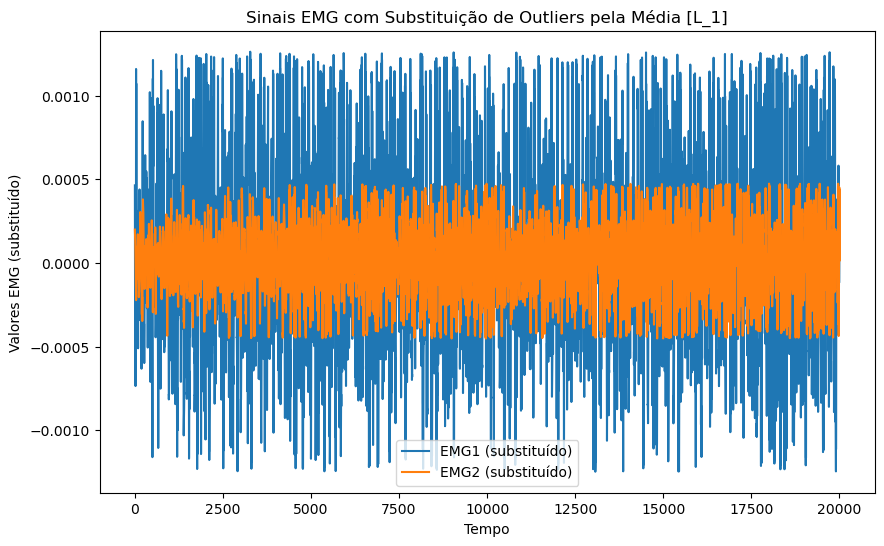

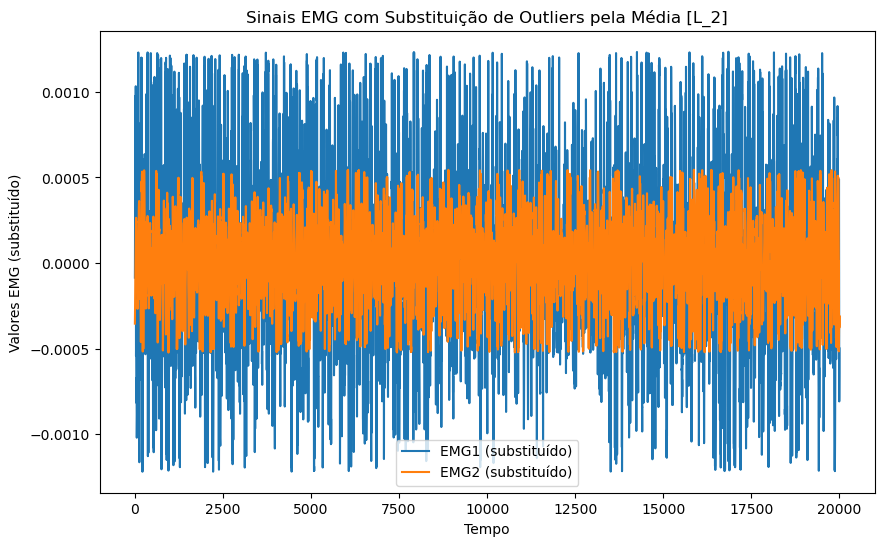

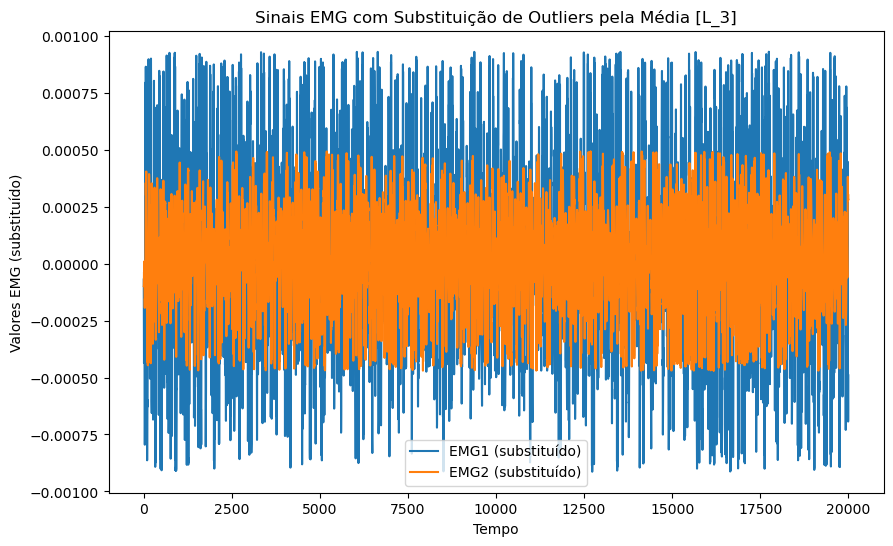

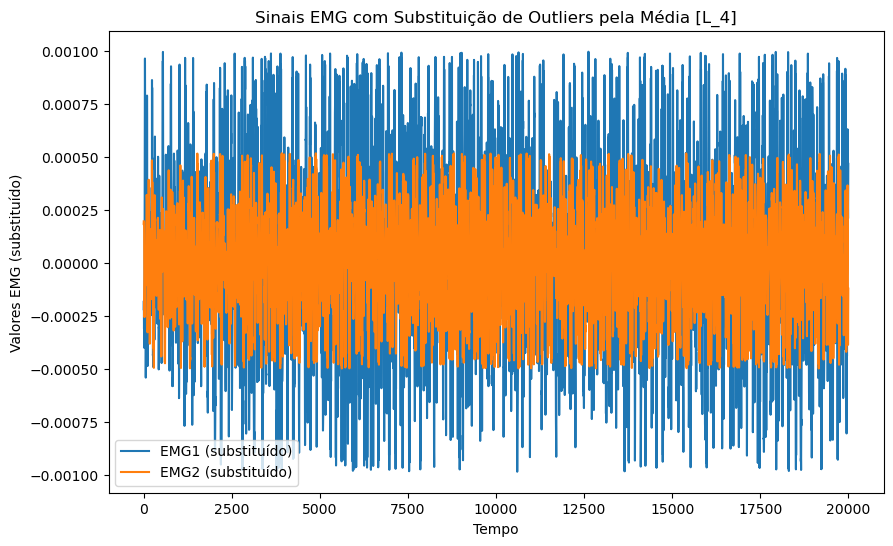

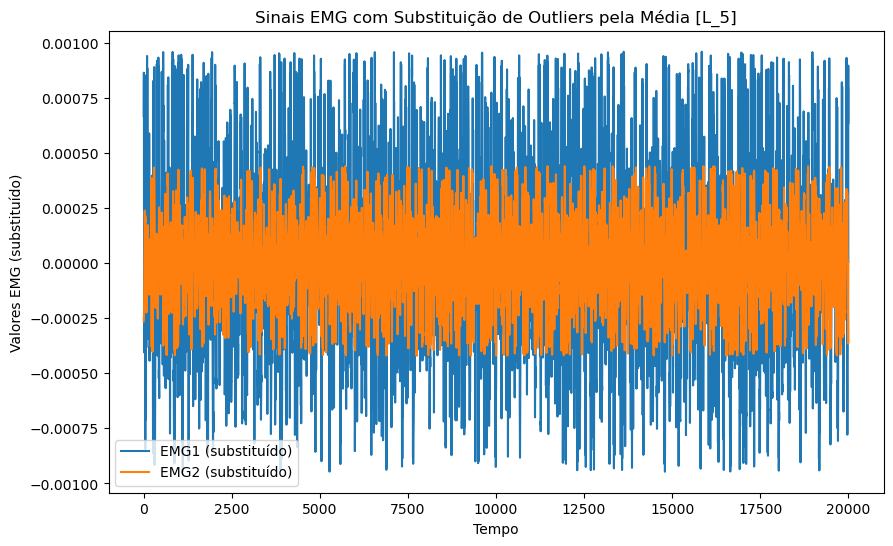

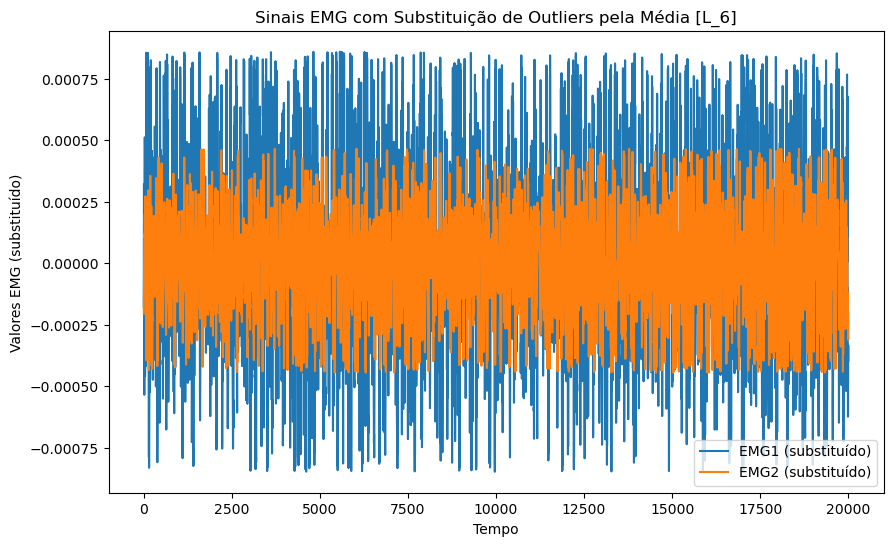

In [24]:


# Iteração sobre a lista de DataFrames no outliers
for i, df_current in enumerate(df_L_no_outliers):
    # Extrair apenas as colunas relevantes
    dados_emg = df_current[colunas_relevantes]

    # Converter o DataFrame para uma matriz NumPy
    matriz_emg = dados_emg.to_numpy()

    # Chamar a função getfTDD_feat_v2
    caracteristicas_emg_L = getfTDDfeat_v2(matriz_emg, steps, winsize, wininc)

    # Agora, 'caracteristicas_emg_L' deve conter as características resultantes para cada conjunto de dados L_1, L_2, ..., L_6
    globals()[f'caracteristicas_emg_L{i+1}'] = caracteristicas_emg_L


In [26]:
caracteristicas_emg_L6

array([[5.46900583e+02, 5.22410800e+02, 4.97566493e+01, ...,
        4.84313397e-02, 6.03802146e-06, 2.42043651e+00],
       [5.58680509e+02, 5.28357044e+02, 2.09274777e+01, ...,
        6.25381901e-02, 3.09687632e+01, 1.70306820e+00],
       [5.38616870e+02, 5.21378099e+02, 5.06173933e+01, ...,
        5.81809393e-02, 1.17049386e-03, 3.61896319e-04],
       ...,
       [5.41893603e+02, 5.26983094e+02, 3.63569815e+01, ...,
        3.97994961e-02, 3.42002571e-01, 7.11463556e-01],
       [5.55661780e+02, 5.37964422e+02, 2.12586617e+01, ...,
        3.51628595e-02, 2.60660828e+01, 3.30055806e+01],
       [5.44095461e+02, 5.26956373e+02, 2.61702768e+01, ...,
        4.69278858e-02, 1.88695825e-01, 2.89986129e-01]])

In [21]:
# CARACTERÍSTICAS L

# Suponha que 'EMG1' e 'EMG2' são suas colunas relevantes no DataFrame
colunas_relevantes = ['EMG1', 'EMG2']

# Armazenando a lista de dataframes em diferentes da dataframes
df_L_1_no_outliers = df_L_no_outliers_list[0]
df_L_2_no_outliers = df_L_no_outliers_list[1]
df_L_3_no_outliers = df_L_no_outliers_list[2]
df_L_4_no_outliers = df_L_no_outliers_list[3]
df_L_5_no_outliers = df_L_no_outliers_list[4]
df_L_6_no_outliers = df_L_no_outliers_list[5]

# Extraia apenas as colunas relevantes
dados_emg = df_L_1_no_outliers[colunas_relevantes]
dados_emg2 = df_L_2_no_outliers[colunas_relevantes]
dados_emg3 = df_L_3_no_outliers[colunas_relevantes]
dados_emg4 = df_L_4_no_outliers[colunas_relevantes]
dados_emg5 = df_L_5_no_outliers[colunas_relevantes]
dados_emg6 = df_L_6_no_outliers[colunas_relevantes]

# Converta o DataFrame para uma matriz NumPy
matriz_emg = dados_emg.to_numpy()
matriz_emg2 = dados_emg2.to_numpy()
matriz_emg3 = dados_emg3.to_numpy()
matriz_emg4 = dados_emg4.to_numpy()
matriz_emg5 = dados_emg5.to_numpy()
matriz_emg6 = dados_emg6.to_numpy()

# Defina outros parâmetros necessários
steps = 5  # valor hipotético, substitua pelo valor desejado
winsize = 100  # substitua pelo tamanho da janela desejado
wininc = 100  # substitua pelo espaçamento entre as janelas desejado

# Chame a função getfTDD_feat_v2
caracteristicas_emg_L1 = getfTDDfeat_v2(matriz_emg, steps, winsize, wininc)
caracteristicas_emg_L2 = getfTDDfeat_v2(matriz_emg2, steps, winsize, wininc)
caracteristicas_emg_L3 = getfTDDfeat_v2(matriz_emg3, steps, winsize, wininc)
caracteristicas_emg_L4 = getfTDDfeat_v2(matriz_emg4, steps, winsize, wininc)
caracteristicas_emg_L5 = getfTDDfeat_v2(matriz_emg5, steps, winsize, wininc)
caracteristicas_emg_L6 = getfTDDfeat_v2(matriz_emg6, steps, winsize, wininc)

# Agora, 'caracteristicas_emg_L' deve conter as características resultantes

In [27]:
caracteristicas_emg_L6

array([[5.46900583e+02, 5.22410800e+02, 4.97566493e+01, ...,
        4.84313397e-02, 6.03802146e-06, 2.42043651e+00],
       [5.58680509e+02, 5.28357044e+02, 2.09274777e+01, ...,
        6.25381901e-02, 3.09687632e+01, 1.70306820e+00],
       [5.38616870e+02, 5.21378099e+02, 5.06173933e+01, ...,
        5.81809393e-02, 1.17049386e-03, 3.61896319e-04],
       ...,
       [5.41893603e+02, 5.26983094e+02, 3.63569815e+01, ...,
        3.97994961e-02, 3.42002571e-01, 7.11463556e-01],
       [5.55661780e+02, 5.37964422e+02, 2.12586617e+01, ...,
        3.51628595e-02, 2.60660828e+01, 3.30055806e+01],
       [5.44095461e+02, 5.26956373e+02, 2.61702768e+01, ...,
        4.69278858e-02, 1.88695825e-01, 2.89986129e-01]])